# Mapping Similarity

References:
- https://cran.r-project.org/web/packages/graphkernels/graphkernels.pdf
- https://graph-tool.skewed.de/
- Mathematics of Big Data
- The Fascinating World of Graph Theory

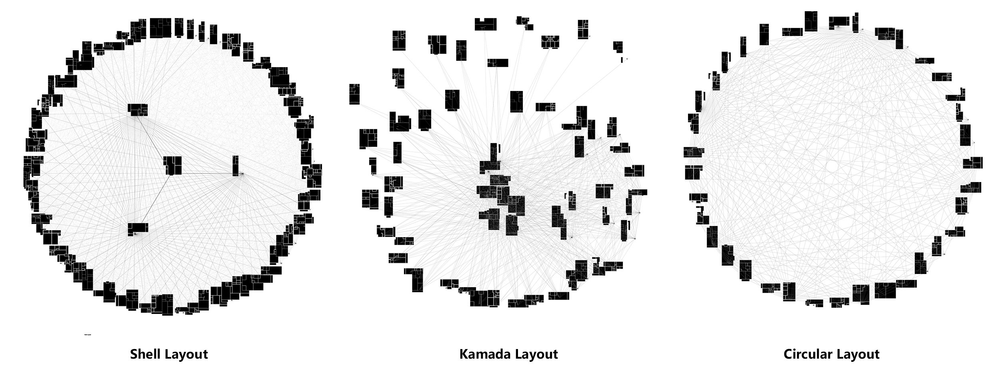

In [47]:
from IPython.display import Image
Image(filename='IMG_GRAPH/layouts.jpg',width=1200, height=300)

In [1]:
import pandas as pd
import cairo
import matplotlib.pylab as plt
import math
from IPython.display import Image
import numpy as np
import glob
import os
import os.path
import time
import cv2
import random
import ast
from shapely.geometry import LineString
import shapely
from graphviz import *
import networkx as nx
import scipy as sc
from IPython.display import Javascript
import json
import sys

from numpy import *
from PIL import Image
from math import *
from scipy.ndimage.interpolation import geometric_transform
from scipy.spatial.distance import pdist, squareform, cdist

from skimage.morphology import skeletonize
from skimage import data
#import sknw

from shapely.geometry import LineString

In [2]:
#import data_list
data_list=pd.read_csv("../CSV/dataset_23_07.csv")
data_list.head()

,path_to_txt,corrected,rooms,plan_clean,network_corrected,rooms_img,walls_corrected
0,.\vector_graphics_floorplans\representation_pr...,corrected/1.txt,rooms/1.txt,plan_clean/1.png,network_corrected/1.png,rooms_png/1.png,walls_corrected/1.png
1,.\vector_graphics_floorplans\representation_pr...,corrected/2.txt,rooms/2.txt,plan_clean/2.png,network_corrected/2.png,rooms_png/2.png,walls_corrected/2.png
2,.\vector_graphics_floorplans\representation_pr...,corrected/4.txt,rooms/4.txt,plan_clean/4.png,network_corrected/4.png,rooms_png/4.png,walls_corrected/4.png
3,.\vector_graphics_floorplans\representation_pr...,corrected/5.txt,rooms/5.txt,plan_clean/5.png,network_corrected/5.png,rooms_png/5.png,walls_corrected/5.png
4,.\vector_graphics_floorplans\representation_pr...,corrected/6.txt,rooms/6.txt,plan_clean/6.png,network_corrected/6.png,rooms_png/6.png,walls_corrected/6.png


In [7]:
def get_points(data_rooms):
    # Get Points
    rooms_ = []
    points_ = []
    for i in range(len(data_rooms)):
        a = data_rooms.loc[i].values
        try:
            points = ast.literal_eval(a[1])
        except:
            points = [[0.0,0.0]]
        points_.append(points)
        try:
            rooms = a[0].split(",")
        except:
            rooms = "NaN"
        rooms_.append(rooms)
    data_room = pd.DataFrame()
    data_room["rooms"] = rooms_
    data_room["points"] = points_
    
    PTS = []
    
    for i in range(len(points_)):
        PTS.append(list(points_[i]))
    
    return PTS, rooms_

## 1/ Get Graphs

In [8]:
data_list=pd.read_csv("../CSV/dataset_23_07.csv")
data_list.head()

,path_to_txt,corrected,rooms,plan_clean,network_corrected,rooms_img,walls_corrected
0,.\vector_graphics_floorplans\representation_pr...,corrected/1.txt,rooms/1.txt,plan_clean/1.png,network_corrected/1.png,rooms_png/1.png,walls_corrected/1.png
1,.\vector_graphics_floorplans\representation_pr...,corrected/2.txt,rooms/2.txt,plan_clean/2.png,network_corrected/2.png,rooms_png/2.png,walls_corrected/2.png
2,.\vector_graphics_floorplans\representation_pr...,corrected/4.txt,rooms/4.txt,plan_clean/4.png,network_corrected/4.png,rooms_png/4.png,walls_corrected/4.png
3,.\vector_graphics_floorplans\representation_pr...,corrected/5.txt,rooms/5.txt,plan_clean/5.png,network_corrected/5.png,rooms_png/5.png,walls_corrected/5.png
4,.\vector_graphics_floorplans\representation_pr...,corrected/6.txt,rooms/6.txt,plan_clean/6.png,network_corrected/6.png,rooms_png/6.png,walls_corrected/6.png


In [11]:
def get_adjacencies(id_image,data_list,save_,print_):
    #id_image = 370
    data = pd.read_csv("../../Pan DB Explorations/"+data_list.loc[id_image]["corrected"], sep="\t",header = None)
    data_rooms=pd.read_csv("../../Pan DB Explorations/"+data_list.loc[id_image]["rooms"], header=None , sep=':')

    room_polylines, room_labels = get_points(data_rooms)
    
    ##### find adjacencies
    adjacencies = []

    adj_matrix = np.zeros((len(room_labels),len(room_labels)))

    for i in range(len(room_polylines)):
        #line1 = LineString(room_polylines[i])
        pol1 = shapely.geometry.Polygon(room_polylines[i])
        for j in range(len(room_polylines)):
            if(i!=j):
                #line2 = LineString(room_polylines[j])
                pol2 = shapely.geometry.Polygon(room_polylines[j])
                #print(str(line1.intersection(line2)))
                if(str(pol1.intersection(pol2))[0]=="L"):
                    adjacencies.append([i,j])
                    adj_matrix[i,j]=1
                    
    fig,graph = draw_plan_w_rooms(id_image,data_list, adjacencies, adj_matrix, room_labels,print_)
    
    if(save_==True):
        fig.savefig('IMG/adj/'+str(id_image)+'.png')
    
    return adjacencies, graph

In [ ]:
graphs = []

for id_image in range(0,1000):
    adj, graph = get_adjacencies(id_image,data_list,save_=False,print_=False)
    graphs.append(graph)

## 2/ Load Similarity Matrix

In [4]:
sim_matrix = np.load("../matrix/sim_matrix_cp.npy")

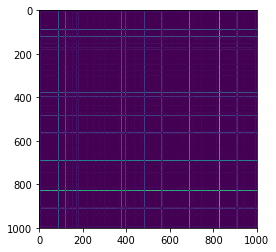

In [5]:
plt.imshow(sim_matrix)

## 3/ One to Many Query

In [11]:
def open_images(path):
    images = glob.glob(path+'*.png')
    def sortKeyFunc(s):
        return int(os.path.basename(s)[:-4])
    images.sort(key=sortKeyFunc)
    return images

def print_matches(nb_neighbors,plan_id,sim_matrix_cp):
    
    ids = np.argsort(sim_matrix_cp[plan_id])[0:nb_neighbors]
    
    path_to_folder = "IMG/1000/"
    
    plt.imshow(cv2.imread(path_to_folder+str(plan_id)+".png",cv2.IMREAD_UNCHANGED),cmap="Greys")
    plt.axis("off")
    plt.title("ID: "+str(plan_id))
    plt.show()
    
    fig = plt.figure(figsize=(20, 10))
    
    width = 9
    height= int(np.floor(len(ids)/width)+1)
    
    for i in range(len(ids)):
        
        plt.subplot(height, width, i+1)
        plt.imshow(cv2.imread(path_to_folder+str(ids[i])+".png",cv2.IMREAD_UNCHANGED),cmap="Greys")
        plt.axis("off")
        plt.title("ID: "+str(ids[i])+" | "+str(np.around(sim_matrix[ids[0]][ids[i]],decimals=5)))
        
    plt.show()

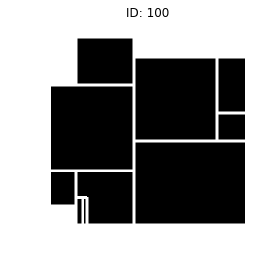

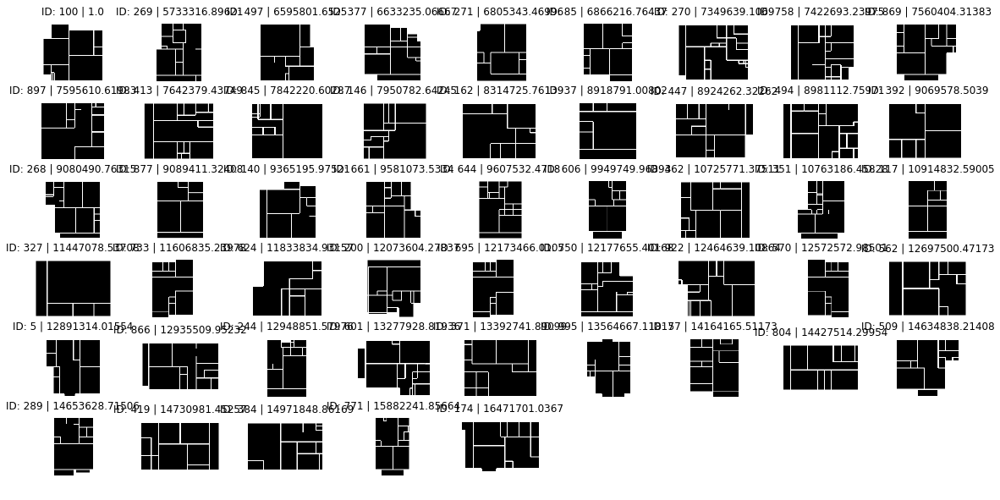

In [13]:
images = open_images('../IMG/footprint/')

#QUERY 1
plan_id = 100
nb_neighbors = 50
print_matches(nb_neighbors,plan_id,sim_matrix)

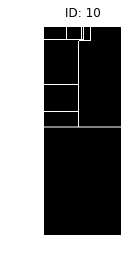

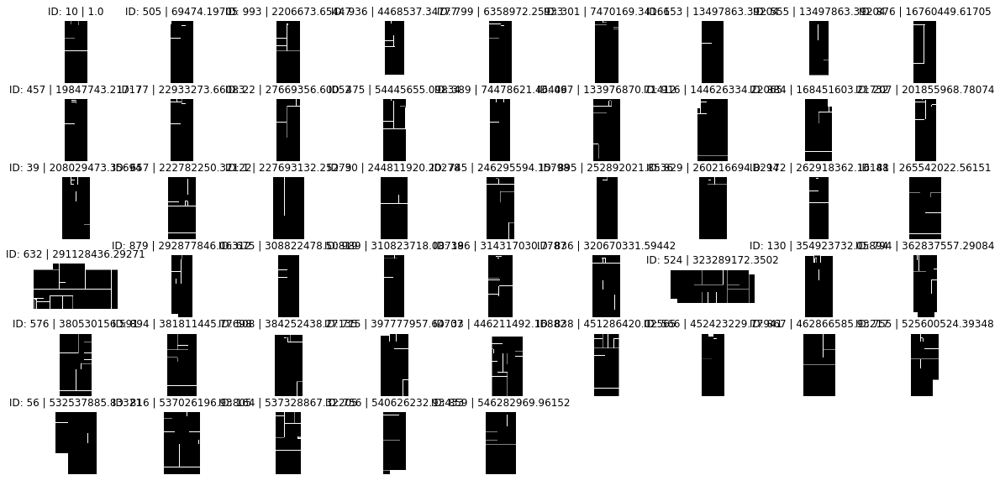

In [34]:
#QUERY 2
plan_id = 10
nb_neighbors = 50
print_matches(nb_neighbors,plan_id,sim_matrix)

## 4) Thresholding

In [16]:
def filter_matrix(sim_matrix, threshold, print_):
    #set threshold
    thresh = threshold
    #filter matrix based on affinity and threshold
    filtered_sim_matrix = sim_matrix.copy()
    filtered_sim_matrix[filtered_sim_matrix<thresh]=0
    #generate graph
    G_mat_=nx.from_numpy_matrix(filtered_sim_matrix)
    
    if(print_==True):
        #get filtered matrix
        plt.imshow(filtered_sim_matrix)
        plt.show()
    return filtered_sim_matrix , G_mat_

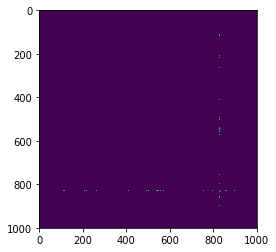

In [43]:
filtered_matrix , G_mat_ = filter_matrix(sim_matrix, 80000000000,print_=True)

## 4) Graph Viz

### Kamada Graph

In [45]:
#https://networkx.github.io/documentation/networkx-1.9/reference/generated/networkx.drawing.nx_pylab.draw_networkx.html
#https://networkx.github.io/documentation/stable/reference/drawing.html

def kamada_graph(G_mat_,images):
    
    #filter graph first to remove isolated nodes
    G_mat_.remove_nodes_from(list(nx.isolates(G_mat_)))
    G_mat_.remove_edges_from(list(nx.isolates(G_mat_)))
    
    fig = plt.figure(figsize=(50, 50))

    #kamada layout
    pos = nx.kamada_kawai_layout(G_mat_)

    labels=nx.draw_networkx(G_mat_,
                            node_size=4,pos=pos,alpha=1,node_color='black',
                            edge_color='grey',width=0.5,
                            font_size=15,font_family='Arial')

    y_lims = plt.ylim()
    x_lims = plt.xlim()

#     for i in range(len(images)):
#         try:
#             x_ = np.interp(pos[i][0], x_lims, (0, fig.bbox.xmax-900))
#             y_ = np.interp(pos[i][1], y_lims, (0, fig.bbox.ymax-900))

#             im = cv2.imread(images[i],cv2.IMREAD_UNCHANGED)

#             if(im.shape[0]>200 or im.shape[1]>200):

#                 max_ = np.argmax([im.shape[0],im.shape[1]])

#                 if(max_==0):   
#                     height = 200
#                     factor = 200/im.shape[0]
#                     width = int(im.shape[1]*factor)
#                     im_resize = cv2.resize(im,(width,height),fx=0, fy=0)

#                 if(max_==1): 
#                     width = 200
#                     factor = 200/im.shape[1]
#                     height = int(im.shape[0]*factor)
#                     im_resize = cv2.resize(im,(width,height),fx=0, fy=0)

#             fig.figimage(im_resize, xo=x_, yo=y_,resize=False,zorder=10)
            #plt.rcParams['figure.dpi']= 200
#         except:
#             pass

    plt.axis('off')
    plt.grid()
    plt.show()

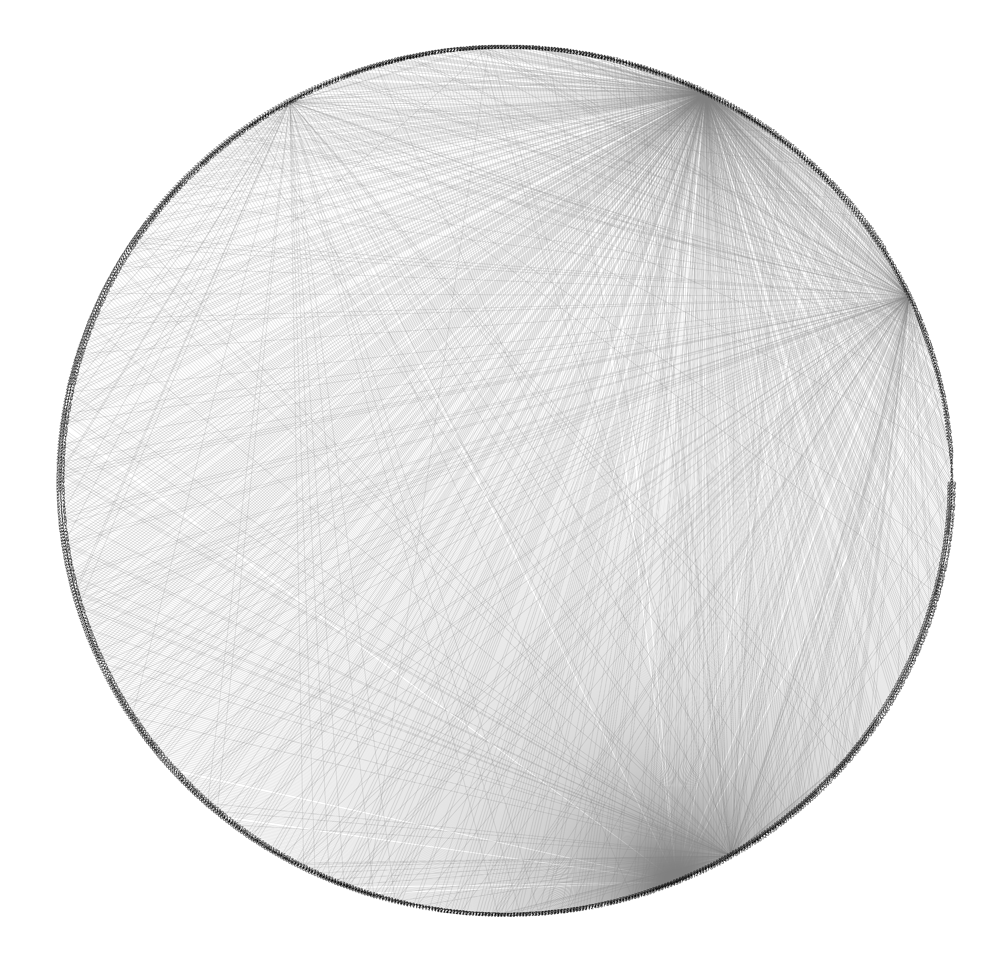

In [46]:
images = glob.glob("IMG/save_net/*.png")
kamada_graph(G_mat_,images)

### Circular Graph

In [22]:
#https://networkx.github.io/documentation/networkx-1.9/reference/generated/networkx.drawing.nx_pylab.draw_networkx.html
#https://networkx.github.io/documentation/stable/reference/drawing.html

def circular_graph(G_mat_,images):
    fig = plt.figure(figsize=(50, 50))
    
    #filter graph first to remove isolated nodes
    G_mat_.remove_nodes_from(list(nx.isolates(G_mat_)))
    G_mat_.remove_edges_from(list(nx.isolates(G_mat_)))

    #shell layout
    pos = nx.shell_layout(G_mat_)

    labels=nx.draw_networkx(G_mat_,
                            node_size=4,pos=pos,alpha=1,node_color='black',
                            edge_color='grey',width=0.6,
                            font_size=15,font_family='Arial')

    y_lims = plt.ylim()
    x_lims = plt.xlim()

    for i in range(len(images)):
        try:
            x_ = np.interp(pos[i][0], x_lims, (0, fig.bbox.xmax-900))
            y_ = np.interp(pos[i][1], y_lims, (0, fig.bbox.ymax-900))

            im = cv2.imread(images[i],cv2.IMREAD_UNCHANGED)

            if(im.shape[0]>200 or im.shape[1]>200):

                max_ = np.argmax([im.shape[0],im.shape[1]])

                if(max_==0):   
                    height = 200
                    factor = 200/im.shape[0]
                    width = int(im.shape[1]*factor)
                    im_resize = cv2.resize(im,(width,height),fx=0, fy=0)

                if(max_==1): 
                    width = 200
                    factor = 200/im.shape[1]
                    height = int(im.shape[0]*factor)
                    im_resize = cv2.resize(im,(width,height),fx=0, fy=0)


            fig.figimage(im_resize, xo=x_, yo=y_,resize=False,zorder=10)
            #plt.rcParams['figure.dpi']= 200
        except:
            pass

    plt.axis('off')
    plt.grid()
    plt.show()

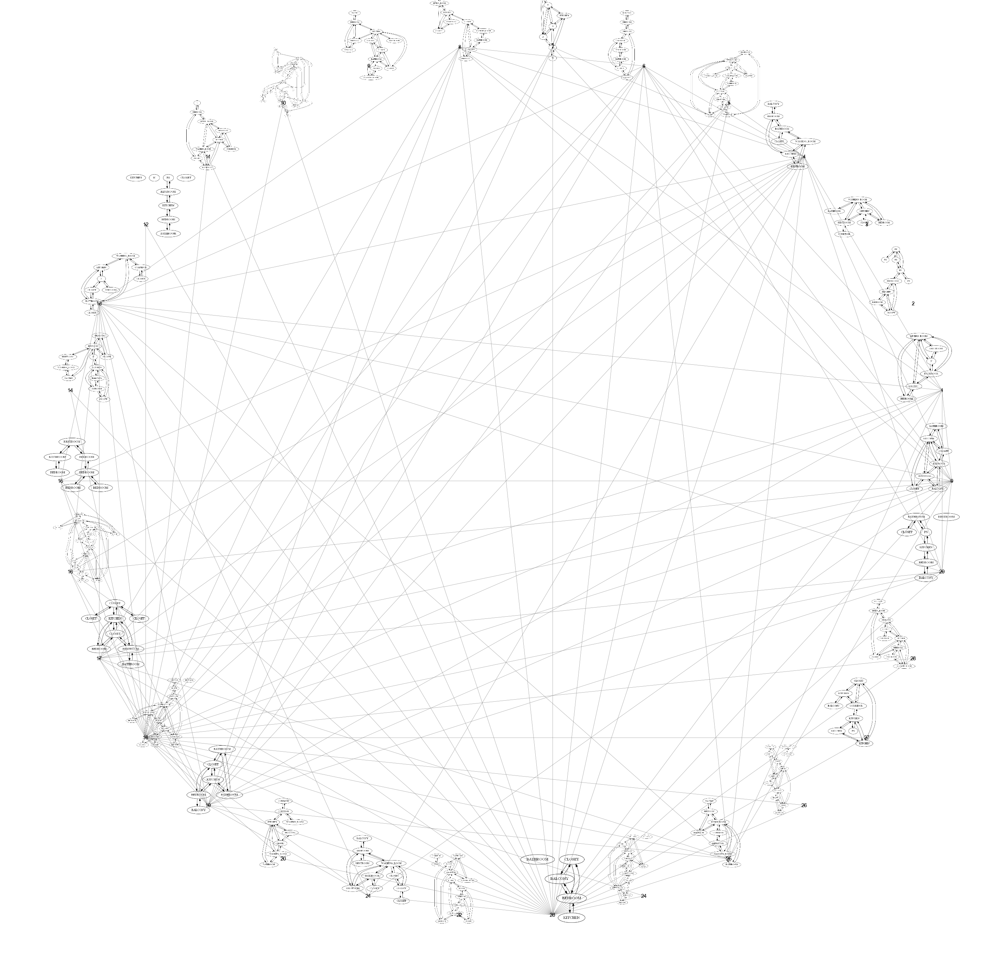

In [46]:
images = glob.glob("IMG/save_net/*.png")
circular_graph(G_mat_,images)

### Shell Layout

In [25]:
#https://networkx.github.io/documentation/networkx-1.9/reference/generated/networkx.drawing.nx_pylab.draw_networkx.html
#https://networkx.github.io/documentation/stable/reference/drawing.html
#https://networkx.github.io/documentation/stable/reference/generated/networkx.drawing.layout.shell_layout.html#networkx.drawing.layout.shell_layout

def shell_graph(G_mat_,images,index_center,filtered_matrix):
    
    #filter graph first to remove isolated nodes
    G_mat_.remove_nodes_from(list(nx.isolates(G_mat_)))
    G_mat_.remove_edges_from(list(nx.isolates(G_mat_)))
    
    fig = plt.figure(figsize=(50, 50))

    #shell layout
    #ALL NODES
    nodes = np.array(list(G_mat_.nodes()))
    
    #SELECT AND DELETE CENTER 
    k= np.where(nodes==index_center)[0]
    center = nodes[k]
    other_nodes = np.delete(nodes,k)
    
    print("center node: ",center)
    print("center neighbors: ", list(G_mat_.neighbors(center[0])))
 
    neighbors = np.array(list(G_mat_.neighbors(center[0])))
    other_nodes = np.delete(other_nodes,np.argwhere(other_nodes==neighbors)[0])
        
    neig_neig_nodes = []
    for neigb in list(G_mat_.neighbors(center[0])):
        neigb_node = list(G_mat_.neighbors(neigb))
        neig_neig_nodes.append(neigb_node)
        print(neigb)
    
    neig_neig_nodes = np.ravel(neig_neig_nodes)
    
    #get neighbor of selected plan
    #sorted_val = np.argsort(filtered_matrix[:,nodes[k]])
    #filter_ = np.sort(filtered_matrix[:,nodes[k]])>0
    #neighbors = sorted_val[filter_]
    #neighbors_id = np.where(np.isin(other_nodes, neighbors)==1)
    #other_nodes = np.delete(other_nodes,neighbors_id)
    
    #AGGREATE SHELLS
    shells = [nodes[k],neighbors,list(neig_neig_nodes)]
    
    print(shells)
    
    pos = nx.shell_layout(G_mat_, shells)
    
    #print(pos)

    labels=nx.draw_networkx(G_mat_,
                            node_size=4,pos=pos,alpha=1,node_color='black',
                            edge_color='grey',width=0.15,
                            font_size=15,font_family='Arial')
    
    y_lims = plt.ylim()
    x_lims = plt.xlim()
    
    edges = np.array(list(G_mat_.edges))
    neighbor_points = np.array(list(G_mat_.edges))[:,1]==center
    neighbor_points_index = np.where(neighbor_points==1)
    
    for index_ in neighbor_points_index[0]:
        plt.plot([pos[edges[index_][0]][0],pos[edges[index_][1]][0]],[pos[edges[index_][0]][1],pos[edges[index_][1]][1]],c="black",zorder=5,lw=1.6)
    
    for neig in neighbors:
        neig_neighbor_points = np.array(list(G_mat_.edges))[:,0]==neig
        neig_neighbor_points_index = np.where(neig_neighbor_points==1)
        for index_ in neig_neighbor_points_index[0]:
            plt.plot([pos[edges[index_][0]][0],pos[edges[index_][1]][0]],[pos[edges[index_][0]][1],pos[edges[index_][1]][1]],c="black",zorder=0,lw=.4)   
  
    for i in range(len(images)):
        try:
            x_ = np.interp(pos[i][0], x_lims, (0, fig.bbox.xmax-900))
            y_ = np.interp(pos[i][1], y_lims, (0, fig.bbox.ymax-900))

            im = cv2.imread(images[i],cv2.IMREAD_UNCHANGED)

            if(im.shape[0]>200 or im.shape[1]>200):

                max_ = np.argmax([im.shape[0],im.shape[1]])

                if(max_==0):   
                    height = 200
                    factor = 200/im.shape[0]
                    width = int(im.shape[1]*factor)
                    im_resize = cv2.resize(im,(width,height),fx=0, fy=0)

                if(max_==1): 
                    width = 200
                    factor = 200/im.shape[1]
                    height = int(im.shape[0]*factor)
                    im_resize = cv2.resize(im,(width,height),fx=0, fy=0)

            fig.figimage(im_resize, xo=x_, yo=y_,resize=False,zorder=10)
            #plt.rcParams['figure.dpi']= 200
        except:
            pass
    
    plt.axis('off')
    plt.grid()
    plt.show()

In [ ]:
images = glob.glob("IMG/1000/*.png")
shell_graph(G_mat_,images,312,filtered_matrix)